In [1]:
import multiprocessing as mp
import cv2
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_score
from sklearn.kernel_approximation import Nystroem
from sklearn import svm
from joblib import Parallel, delayed, cpu_count
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from skimage.feature import hog
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pickle
import time
from datasets.load import load_images

plt.rcParams["figure.figsize"] = (15.0, 12.0)  # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
# plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
%load_ext autoreload
%autoreload 2

ModuleNotFoundError: No module named 'datasets'

In [ ]:
plt.rcParams["figure.figsize"] = (15.0, 12.0)  # set default size of plots

In [ ]:
with open("cache/training/neg_samples.pkl", "rb") as f:
    neg_samples = pickle.load(f)
with open("cache/training/waldo.pkl", "rb") as f:
    pos_waldo = pickle.load(f)
with open("cache/training/wenda.pkl", "rb") as f:
    pos_wenda = pickle.load(f)
with open("cache/training/wizard.pkl", "rb") as f:
    pos_wizard = pickle.load(f)


 ## Compute HOG feature descriptor for all samples

Sample image shape (128, 128), feature vector shape (3600,)
Sample image shape (128, 128), feature vector shape (3600,)
Sample image shape (128, 128), feature vector shape (3600,)
Sample image shape (128, 128), feature vector shape (3600,)


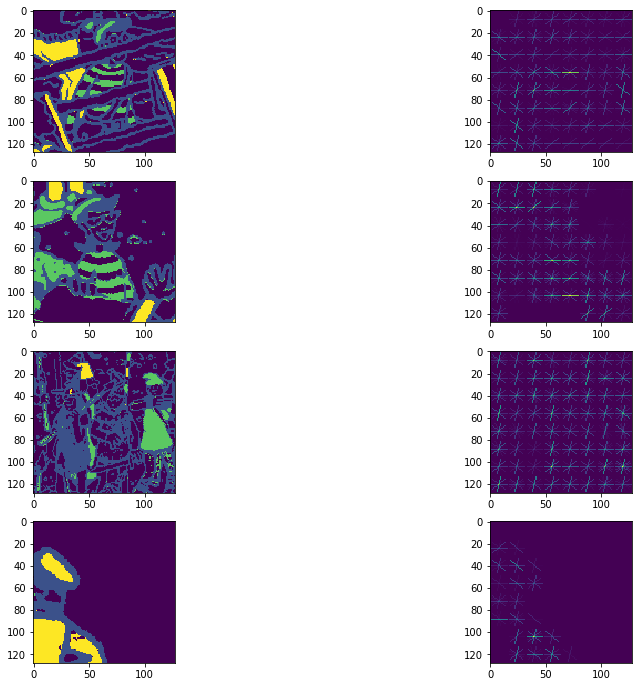

In [4]:
# DESCRIPTOR CONFIG
ORIENTATIONS_G = 9
PIXELS_PER_CELL_G = (16,16)
CELLS_PER_BLOCK_G = (4,4)
ORIENTATIONS_C = 9
PIXELS_PER_CELL_C = (16,16)
CELLS_PER_BLOCK_C = (4,4)


# viualize the descriptor once for each class
for i, s in enumerate([pos_waldo[0], pos_wenda[0], pos_wizard[0], neg_samples[0]]):
    feature, hog_image = hog(
        s,
        orientations=ORIENTATIONS_G,
        pixels_per_cell=PIXELS_PER_CELL_G,
        cells_per_block=CELLS_PER_BLOCK_G,
        visualize=True,
        multichannel=False,
    )
    print(
        "Sample image shape {}, feature vector shape {}".format(s.shape, feature.shape)
    )
    plt.subplot(4, 2, 2 * i + 1)
    plt.imshow(s)
    plt.subplot(4, 2, 2 * i + 2)
    plt.imshow(hog_image)

plt.show()



In [5]:
from feature_descriptor import describe

LABELS = {"waldo": 0, "wenda": 1, "wizard": 2, "negative": 3}

def feature_descriptor(samples, parallel=False):
    res = None
    if parallel:
        res = Parallel(n_jobs=cpu_count())(
            delayed(describe)(
                s,
                orientations_g=ORIENTATIONS_G,
                pixels_per_cell_g=PIXELS_PER_CELL_G,
                cells_per_block_g=CELLS_PER_BLOCK_G,
                orientations_c=ORIENTATIONS_C,
                pixels_per_cell_c=PIXELS_PER_CELL_C,
                cells_per_block_c=CELLS_PER_BLOCK_C,
            )
            for s in samples
        )
    else:
        res = [
            describe(
                s,
                orientations_g=ORIENTATIONS_G,
                pixels_per_cell_g=PIXELS_PER_CELL_G,
                cells_per_block_g=CELLS_PER_BLOCK_G,
                orientations_c=ORIENTATIONS_C,
                pixels_per_cell_c=PIXELS_PER_CELL_C,
                cells_per_block_c=CELLS_PER_BLOCK_C,
            )
            for s in samples
        ]
    return np.array(res)

In [6]:
# transform samples into feature space
pf_wa = feature_descriptor(pos_waldo, parallel=True)
pf_we = feature_descriptor(pos_wenda, parallel=True)
pf_wi = feature_descriptor(pos_wizard, parallel=True)
nf_s = feature_descriptor(neg_samples, parallel=True)

X = np.concatenate((pf_wa, pf_we, pf_wi, nf_s), axis=0)
Y = np.concatenate(
    (
        np.full(pf_wa.shape[0], LABELS["waldo"]),
        np.full(pf_we.shape[0], LABELS["wenda"]),
        np.full(pf_wi.shape[0], LABELS["wizard"]),
        np.full(nf_s.shape[0], LABELS["negative"]),
    ),
    axis=0,
)

x_train, y_train = X, Y


In [7]:
print("training data shape: examples: {}, labels: {}".format(x_train.shape, y_train.shape))

pos = pf_wa.shape[0] + pf_we.shape[0] + pf_wi.shape[0]
neg = nf_s.shape[0]
tot = X.shape[0]

print('waldo: {} {:2.2f}%'.format(pf_wa.shape[0], pf_wa.shape[0]*100/tot))
print('wenda: {} {:2.2f}%'.format(pf_we.shape[0], pf_we.shape[0]*100/tot))
print('wizard: {} {:2.2f}%'.format(pf_wi.shape[0], pf_wi.shape[0]*100/tot))
print('negative: {} {:2.2f}%'.format(nf_s.shape[0], nf_s.shape[0]*100/tot))


print('positive examples:\t{}\t{:2.2f}% \nnegative examples\t{}\t{:2.2f}%'.format(pos, pos*100/tot, neg, neg*100/tot))


training data shape: examples: (13467, 7200), labels: (13467,)
waldo: 124 0.92%
wenda: 36 0.27%
wizard: 24 0.18%
negative: 13283 98.63%
positive examples:	184	1.37% 
negative examples	13283	98.63%


 ## Train Support Vector Machine Classifier (SVC)

In [8]:
from sklearn.multiclass import OneVsOneClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'C': [1e-3, 0.01, 0.1, 10, 100, 1000],
    'gamma': [1e-4, 1e-3, 0.01, 0.1, 1, 10, 100],
    'kernel': ['rbf', 'linear'],
}


print(x_train.shape, y_train.shape)

# This uses hyperparameter search to find the best model.
# Therefore it can be quite slow!
#clf = GridSearchCV(svm.SVC(class_weight='balanced', random_state=0, decision_function_shape='ovo', probability=True),
#                  param_grid, refit=True, n_jobs=-1, cv=5)

clf = svm.SVC(C=10, gamma=0.01, kernel='rbf', class_weight='balanced', random_state=0, decision_function_shape='ovo', probability=True, verbose=True)

clf.fit(x_train, y_train)


#print('best parameters:')
#print(clf.best_params_)
#print(clf.best_estimator_)

# save model to disk
with open("./Linear_SVM_V4.pkl", "wb") as f:
    pickle.dump(clf, f)


(13467, 7200) (13467,)
[LibSVM]

In [9]:
with open("./Linear_SVM_V4.pkl", "rb") as f:
    clf = pickle.load(f)

 ## Evaluate Classifier

In [10]:
# load testing data
with open("cache/testing/waldo.pkl", "rb") as f:
    test_waldo = pickle.load(f)
with open("cache/testing/wenda.pkl", "rb") as f:
    test_wenda = pickle.load(f)
with open("cache/testing/wizard.pkl", "rb") as f:
    test_wizard = pickle.load(f)
with open("cache/testing/neg_samples.pkl", "rb") as f:
    test_neg_samples = pickle.load(f)[:20]

# transform samples into feature space
test_waldo = feature_descriptor(test_waldo, parallel=True)
test_wenda = feature_descriptor(test_wenda, parallel=True)
test_wizard = feature_descriptor(test_wizard, parallel=True)
test_neg_samples = feature_descriptor(test_neg_samples, parallel=True)

x_test = np.concatenate((test_waldo, test_wenda, test_wizard, test_neg_samples), axis=0)
y_test = np.concatenate(
    (
        np.full(test_waldo.shape[0], LABELS["waldo"]),
        np.full(test_wenda.shape[0], LABELS["wenda"]),
        np.full(test_wizard.shape[0], LABELS["wizard"]),
        np.full(test_neg_samples.shape[0], LABELS["negative"]),
    ),
    axis=0,
)


In [11]:
from sklearn.metrics import classification_report
print(classification_report(y_test, clf.predict(x_test),
                           target_names=LABELS))

              precision    recall  f1-score   support

       waldo       1.00      0.69      0.82        13
       wenda       0.80      0.57      0.67         7
      wizard       0.00      0.00      0.00         3
    negative       0.69      1.00      0.82        20

    accuracy                           0.77        43
   macro avg       0.62      0.57      0.58        43
weighted avg       0.75      0.77      0.74        43



/Users/databook/miniconda3/envs/cvpr/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## Display confusion matrix

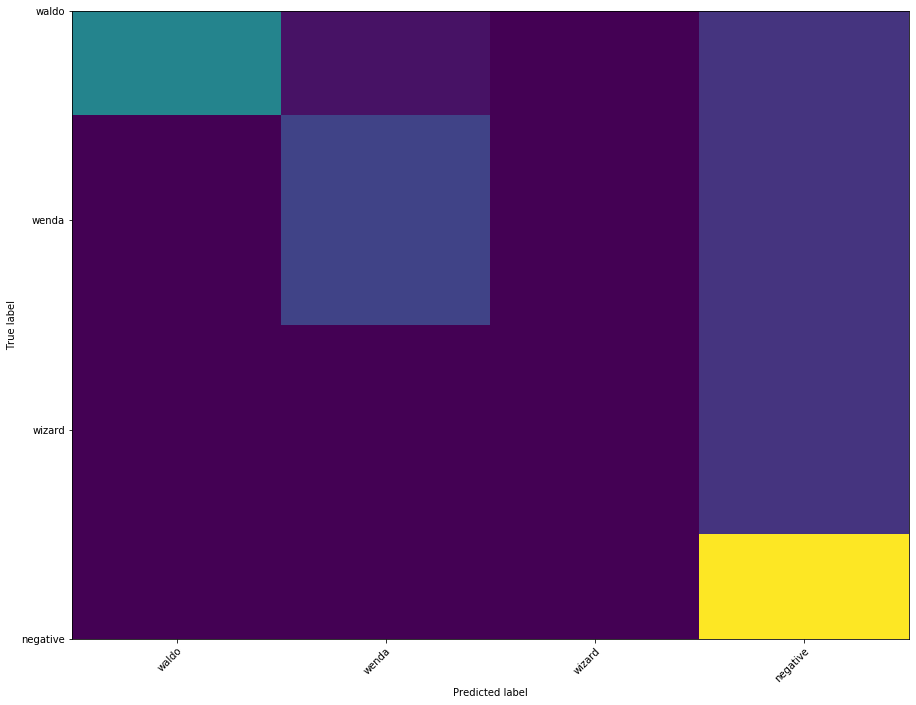

In [12]:
from sklearn.metrics import confusion_matrix

y_pred = clf.predict(x_test)
conf_matrix = confusion_matrix(y_test, y_pred)

ax = plt.subplot()
ax.imshow(conf_matrix, interpolation='nearest')
ax.set(xticks=np.arange(conf_matrix.shape[1]),
       yticks=np.arange(conf_matrix.shape[0]),
       xticklabels=LABELS, yticklabels=LABELS,
       ylabel='True label',
       xlabel='Predicted label')
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")
plt.show()

 ## Try the classifier on one sample image

In [13]:
with open('./Linear_SVM_V3_KMeans.pkl', 'rb') as f:
    kmeans = pickle.load(f)
    K = 5
    
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    d = codebook.shape[1]
    image = np.zeros((w, h, d), dtype=np.uint8)
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i,j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

def process_img(img):
    w,h,d = img.shape
    labels = kmeans.predict(np.reshape(img, (w*h,d)))
    
    white_idx =  np.argmin([np.linalg.norm(np.array([253, 253, 253]) - c) for c in kmeans.cluster_centers_])
    other_col_idx = np.argmin([np.linalg.norm(np.array([182,159,154]) - c) for c in kmeans.cluster_centers_])
    labels[labels == other_col_idx] = white_idx
    
    c = (np.arange(0,K) * 255 / (K-1)).astype(np.uint8)[np.newaxis].T
    cluster_centers = np.hstack([c,c,c])
    return recreate_image(cluster_centers, labels, w,h)[:,:,0]

In [65]:
def bbx_iou(bbx1, bbx2):
    assert bbx1['x1'] < bbx1['x2']
    assert bbx1['y1'] < bbx1['y2']
    assert bbx2['x1'] < bbx2['x2']
    assert bbx2['y1'] < bbx2['y2']
    
    # determine the coordinates of the intersection rectangle
    x_left = max(bbx1['x1'], bbx2['x1'])
    y_top = max(bbx1['y1'], bbx2['y1'])
    x_right = min(bbx1['x2'], bbx2['x2'])
    y_bottom = min(bbx1['y2'], bbx2['y2'])
    
    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    
    # compute the area of both AABBs
    bbx1_area = (bbx1['x2'] - bbx1['x1']) * (bbx1['y2'] - bbx1['y1'])
    bbx2_area = (bbx2['x2'] - bbx2['x1']) * (bbx2['y2'] - bbx2['y1'])
    
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bbx1_area + bbx2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

def non_max_suppression(detections, threshold=0.0):
    if len(detections) == 0: return detections
    
    groups = [[detections[0]]]
    # group detections if overlap is greather than threshold
    for d in detections:
        for idx, g in enumerate(groups):
            if np.max([bbx_iou(d['w'], bbx['w']) for bbx in g]) > threshold:
                groups[idx].append(d)
                break
        else:
            groups.append([d])
        
    detections = []
    for g in groups:
        detections.append(g[np.argmax(x['p'] for x in g)])
    # delte detection if p_ratio is less than 1.5
    detections = [d for d in detections if d['p_ratio'] > 1.5]
    return detections


In [103]:
def draw_bbox(ax, text, box, col='r'):
    r = patches.Rectangle((box['x1'], box['y1']), 
                          box['x2'] - box['x1'],
                          box['y2'] - box['y1'],
                          linewidth=3,
                          edgecolor=col,
                          facecolor='none')
    ax.add_patch(r)
    ax.text(box['x1'], box['y1'], text,
            bbox={'facecolor': col, 'linewidth': 0})

def draw_annotation(ax, classes):
    for idx, cl in enumerate(classes):
        col = 'g'
        for box in cl['bounds']:
            draw_bbox(ax, cl['name'], box, col)

def dict_invert(key, d):
    return set(k for k, v in d.items() if v == key).pop()

def variance(img, w=None, size=250):
    if w is not None:
        img = img[w['y1']:w['y2'], w['x1']:w['x2']]

    r = np.random.choice(img[:,:,0].ravel(), size)
    g = np.random.choice(img[:,:,1].ravel(), size)
    b = np.random.choice(img[:,:,2].ravel(), size)
    return np.array([np.var(r), np.var(g), np.var(b)])

def _transform_feature(img, w, var):
    #if np.max(variance(img, w)) < var:
    #    return ({}, None)
    window = cv2.resize(img[w['y1']:w['y2'], w['x1']:w['x2']], dsize=(128, 128), interpolation=cv2.INTER_LINEAR)
    return (w, feature_descriptor([process_img(window)]))

def _predict(w, feat_vect):
    if feat_vect is None: return None
    
    label = clf.predict(feat_vect)[0]
    
    
    if LABELS['negative'] != label:
        proba = clf.predict_proba(feat_vect)[0]
        p_ratio = proba[label] / np.max(proba[proba != proba[label]])
        
        d = {'w':w, 'class':dict_invert(label, LABELS), 'p':proba[label], 'p_ratio': p_ratio}
        print(d)
        return d
    return {}

def detect_img(img, ground_truth=None):
    img_y, img_x = img.shape[:2]
    size = 128
                  
    var = np.mean(variance(img, size=1000)) * 2/3
    print('performing detection on image of size {} with window size {}'.format(img.shape, size))
        
    with mp.Pool(mp.cpu_count()) as p:
        args = []
        for scale in [1, 2, 4, 6]:
            window_size = int(size * scale)
            for y in range(0, img_y - window_size, window_size // 4):
                for x in range(0, img_x - window_size, window_size // 4):
                    args.append((img, 
                                 {'y1':y, 'y2':y + window_size, 
                                  'x1':x, 'x2':x + window_size},
                                 var))

        print("transforming image windows into feature space")

        feature_vectors = p.starmap(_transform_feature, args)

        print('... done')
        print("detecting classes for windows")
        print('detections:')
        
        detections = p.starmap(_predict, feature_vectors)
        
        
        omitted = 0
        detections_ = []
        for d in detections:
            if d: detections_.append(d)
            elif d is None: omitted += 1
        detections = detections_   

    
    print('omitted {:2f}% of windows'.format(omitted / len(feature_vectors)*100))
    print('evaluated {} windows'.format(len(feature_vectors)))
    
    #detections = non_max_suppression(detections)
    print('num classes after non_max_supp: {}'.format(len(detections)))
    
    ax = plt.subplot(1, 1, 1)
    plt.imshow(img)
    # draw gound truth
    #draw_annotation(ax, sample['classes'])

    # draw detections
    for d in detections:
        draw_bbox(ax, '{} $({:2.1f},{:2.1f})$'.format(d['class'], d['p'], d['p_ratio']), d['w'])
    if ground_truth is not None:
        draw_annotation(ax, ground_truth)
        
    plt.show()
    return np.array(detections)
    

performing detection on image of size (918, 996, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
omitted 0.000000% of windows
evaluated 850 windows
num classes after non_max_supp: 0


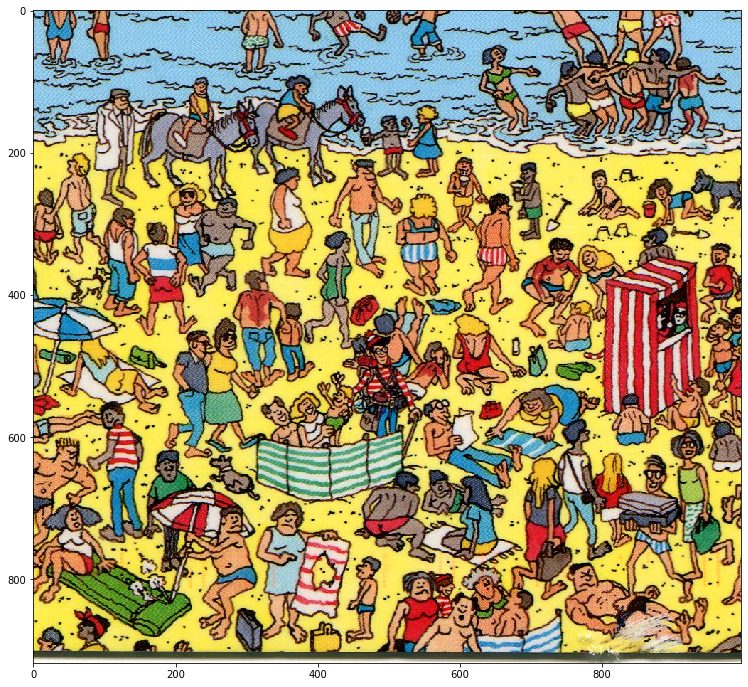

elapsed time 9.70626972100581 s


In [104]:
with open('cache/waldo45.pkl', 'rb') as f:
    sample = pickle.load(f)
    

start = time.perf_counter()   
detect_img(sample['img'])

print('elapsed time {} s'.format(time.perf_counter() - start))

performing detection on image of size (2556, 1972, 3) with window size 128
transforming image windows into feature space
{'w': {'y1': 96, 'y2': 224, 'x1': 224, 'x2': 352}, 'class': 'waldo', 'p': 0.7495293793707906, 'p_ratio': 4.476781334286989}
... done
detecting classes for windows
detections:
{'w': {'y1': 384, 'y2': 512, 'x1': 1344, 'x2': 1472}, 'class': 'waldo', 'p': 0.33491849888323977, 'p_ratio': 0.6538230174863329}
{'w': {'y1': 128, 'y2': 256, 'x1': 1184, 'x2': 1312}, 'class': 'waldo', 'p': 0.5262849051500215, 'p_ratio': 1.1366353242053158}
{'w': {'y1': 800, 'y2': 928, 'x1': 864, 'x2': 992}, 'class': 'waldo', 'p': 0.6034620809781681, 'p_ratio': 2.1355411098381687}
{'w': {'y1': 896, 'y2': 1024, 'x1': 896, 'x2': 1024}, 'class': 'waldo', 'p': 0.7947453646769818, 'p_ratio': 4.769559118926099}
{'w': {'y1': 992, 'y2': 1120, 'x1': 1728, 'x2': 1856}, 'class': 'waldo', 'p': 0.42105510589795797, 'p_ratio': 0.7547262042197559}
{'w': {'y1': 1088, 'y2': 1216, 'x1': 1792, 'x2': 1920}, 'class':

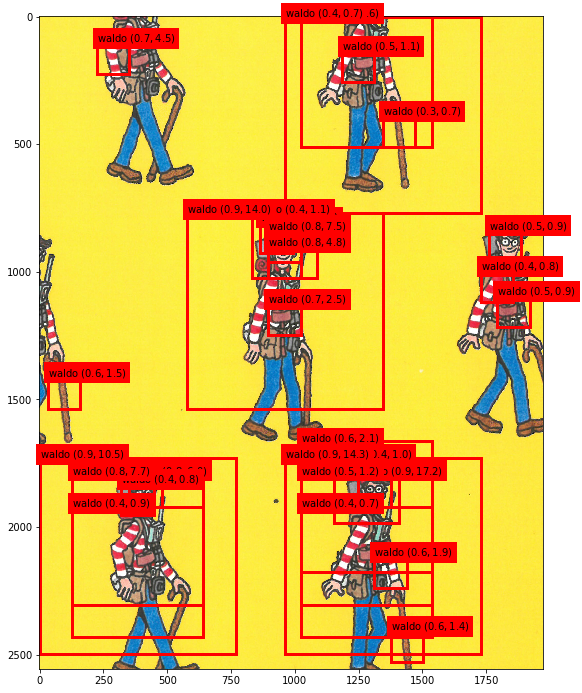

elapsed time 61.276682045994676 s


In [105]:
with open('cache/waldo29.pkl', 'rb') as f:
    sample = pickle.load(f)

start = time.perf_counter()   
detect_img(sample['img'])

print('elapsed time {} s'.format(time.perf_counter() - start))

performing detection on image of size (615, 603, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
omitted 0.000000% of windows
evaluated 277 windows
num classes after non_max_supp: 0


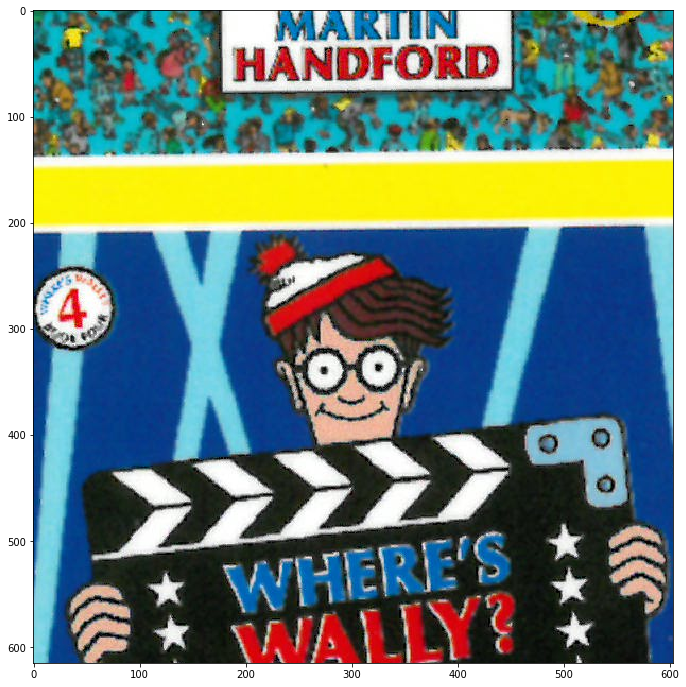

elapsed time 4.2553181370021775 s


In [106]:
with open('cache/waldo48.pkl', 'rb') as f:
    sample = pickle.load(f)
    
start = time.perf_counter()   
detect_img(sample['img'])

print('elapsed time {} s'.format(time.perf_counter() - start))

performing detection on image of size (746, 831, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 384, 'y2': 512, 'x1': 352, 'x2': 480}, 'class': 'wenda', 'p': 0.9442788779577833, 'p_ratio': 20.627163630528973}
{'w': {'y1': 512, 'y2': 640, 'x1': 288, 'x2': 416}, 'class': 'waldo', 'p': 0.32626556366915227, 'p_ratio': 0.7030799977052534}
{'w': {'y1': 416, 'y2': 544, 'x1': 352, 'x2': 480}, 'class': 'wenda', 'p': 0.5822055681962787, 'p_ratio': 1.8338854006995056}
omitted 0.000000% of windows
evaluated 518 windows
num classes after non_max_supp: 3


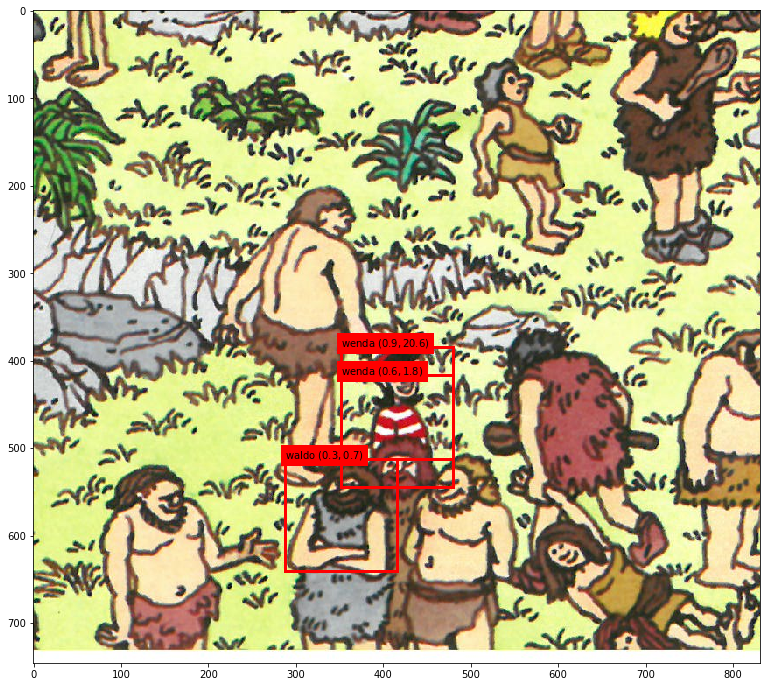

elapsed time 7.378851124987705 s


In [107]:
with open('cache/waldo3.pkl', 'rb') as f:
    sample = pickle.load(f)
    
start = time.perf_counter()   
detect_img(sample['img'])

print('elapsed time {} s'.format(time.perf_counter() - start))

performing detection on image of size (717, 410, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
omitted 0.000000% of windows
evaluated 195 windows
num classes after non_max_supp: 0


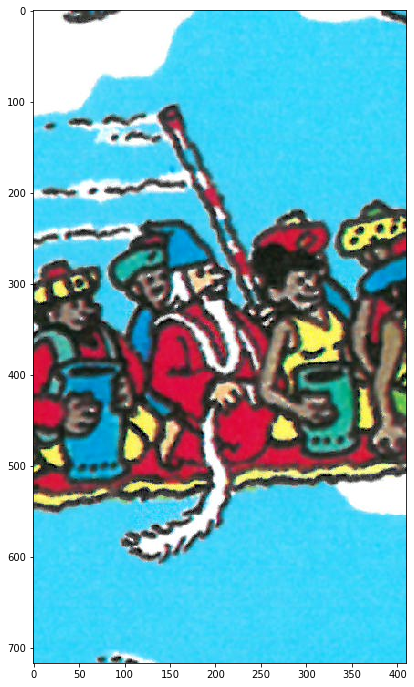

elapsed time 3.2916556839918485 s


In [108]:
with open('cache/waldo39.pkl', 'rb') as f:
    sample = pickle.load(f)
    
start = time.perf_counter()   
detect_img(sample['img'])

print('elapsed time {} s'.format(time.perf_counter() - start))

In [109]:
def rescale(img, min_size=3000, max_size=4096, ground_truth_boxes=None):
    h,w = img.shape[:2]
    if max(h,w) > max_size:
        if w > h:
            dsize = (max_size, int(h * max_size / w))
            s = max_size/w
        else:
            dsize = (int(w * max_size / h), max_size)
            s = max_size/h
    elif min(h,w) < min_size:
        if w > h:
            dsize = (int(w * min_size / h), min_size)
            s = min_size/h
        else:
            dsize = (min_size, int(h * min_size / w))
            s = min_size/w

    img = cv2.resize(img, dsize=dsize, interpolation=cv2.INTER_LINEAR)
    
    if ground_truth_boxes:
        gt = []
        for cl in ground_truth_boxes:
            gt.append({
                'name': cl['name'],
                'bounds': [{'x1': int(b['x1']*s), 'y1': int(b['y1']*s),
                            'x2': int(b['x2']*s), 'y2': int(b['y2']*s)} for b in cl['bounds']]
            })
        return img, gt, s
    else:
        return img
    


In [22]:
samples = load_images('val', 'datasets')

performing detection on image of size (3000, 4771, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 96, 'y2': 224, 'x1': 3520, 'x2': 3648}, 'class': 'waldo', 'p': 0.6624477828666795, 'p_ratio': 2.4327039377989674}
{'w': {'y1': 128, 'y2': 256, 'x1': 3072, 'x2': 3200}, 'class': 'waldo', 'p': 0.4444783528412822, 'p_ratio': 1.1073060025444528}
{'w': {'y1': 64, 'y2': 192, 'x1': 3040, 'x2': 3168}, 'class': 'waldo', 'p': 0.4840817715278576, 'p_ratio': 1.090081845033227}
{'w': {'y1': 96, 'y2': 224, 'x1': 608, 'x2': 736}, 'class': 'wenda', 'p': 0.5451849889137178, 'p_ratio': 2.237149082635619}
{'w': {'y1': 192, 'y2': 320, 'x1': 4544, 'x2': 4672}, 'class': 'waldo', 'p': 0.3628720301678, 'p_ratio': 0.7382218169732869}
{'w': {'y1': 928, 'y2': 1056, 'x1': 1216, 'x2': 1344}, 'class': 'waldo', 'p': 0.5637227585642826, 'p_ratio': 1.337388159487909}
{'w': {'y1': 1760, 'y2': 1888, 'x1': 3840, 'x2': 3968}, 'class': 'wald

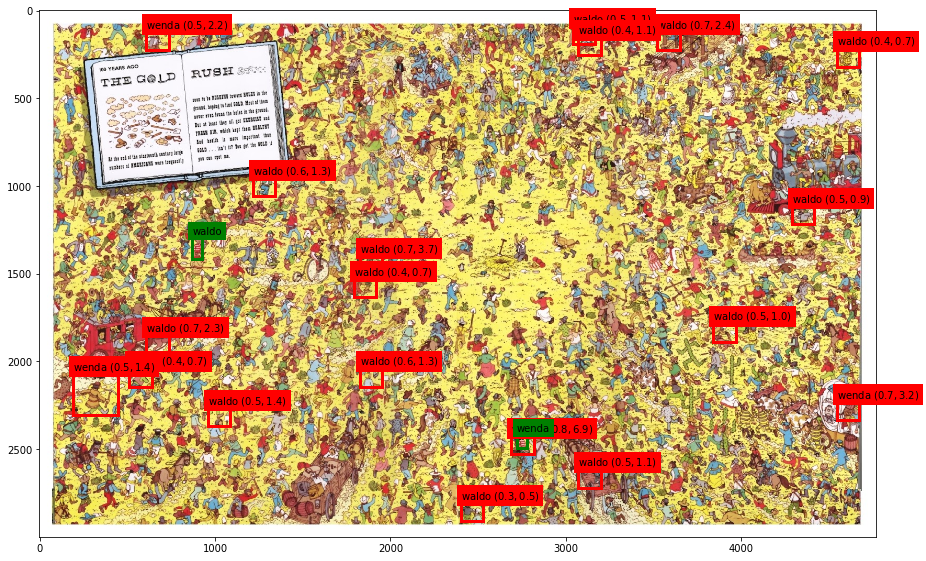

elapsed time 209.838737588012 s

performing detection on image of size (2896, 4096, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 576, 'y2': 704, 'x1': 2624, 'x2': 2752}, 'class': 'waldo', 'p': 0.4412709088500124, 'p_ratio': 0.8993575611076297}
{'w': {'y1': 768, 'y2': 896, 'x1': 1632, 'x2': 1760}, 'class': 'waldo', 'p': 0.5380411868866807, 'p_ratio': 1.397217529330441}
{'w': {'y1': 768, 'y2': 896, 'x1': 2272, 'x2': 2400}, 'class': 'waldo', 'p': 0.5246730176398983, 'p_ratio': 1.4327897841251673}
{'w': {'y1': 1248, 'y2': 1376, 'x1': 960, 'x2': 1088}, 'class': 'waldo', 'p': 0.41528505478137556, 'p_ratio': 1.2781272258267786}
{'w': {'y1': 1024, 'y2': 1152, 'x1': 2016, 'x2': 2144}, 'class': 'waldo', 'p': 0.4393594633381437, 'p_ratio': 0.84748577813224}
{'w': {'y1': 1024, 'y2': 1152, 'x1': 3744, 'x2': 3872}, 'class': 'wizard', 'p': 0.42422736191240273, 'p_ratio': 0.7476408143774487}
{'w': {'y1': 1600, 'y2

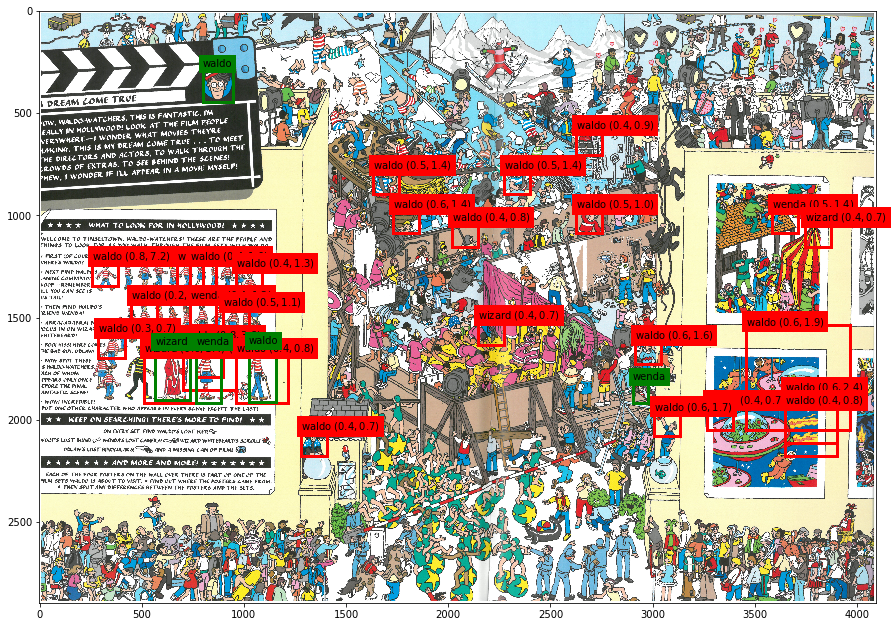

elapsed time 166.659712587003 s

performing detection on image of size (2895, 4096, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 320, 'y2': 448, 'x1': 384, 'x2': 512}, 'class': 'waldo', 'p': 0.814690378197307, 'p_ratio': 5.451752249322562}
{'w': {'y1': 1600, 'y2': 1728, 'x1': 2752, 'x2': 2880}, 'class': 'wizard', 'p': 0.39668954371116505, 'p_ratio': 0.6594168136922814}
{'w': {'y1': 1344, 'y2': 1472, 'x1': 416, 'x2': 544}, 'class': 'waldo', 'p': 0.4337886785469933, 'p_ratio': 0.7906906156456082}
{'w': {'y1': 1664, 'y2': 1792, 'x1': 2240, 'x2': 2368}, 'class': 'waldo', 'p': 0.49862527870150064, 'p_ratio': 1.012627712340742}
{'w': {'y1': 2720, 'y2': 2848, 'x1': 640, 'x2': 768}, 'class': 'wizard', 'p': 0.5667658344337002, 'p_ratio': 1.321257687088788}
{'w': {'y1': 256, 'y2': 512, 'x1': 320, 'x2': 576}, 'class': 'waldo', 'p': 0.7802171348689614, 'p_ratio': 3.850298167989901}
{'w': {'y1': 2720, 'y2': 284

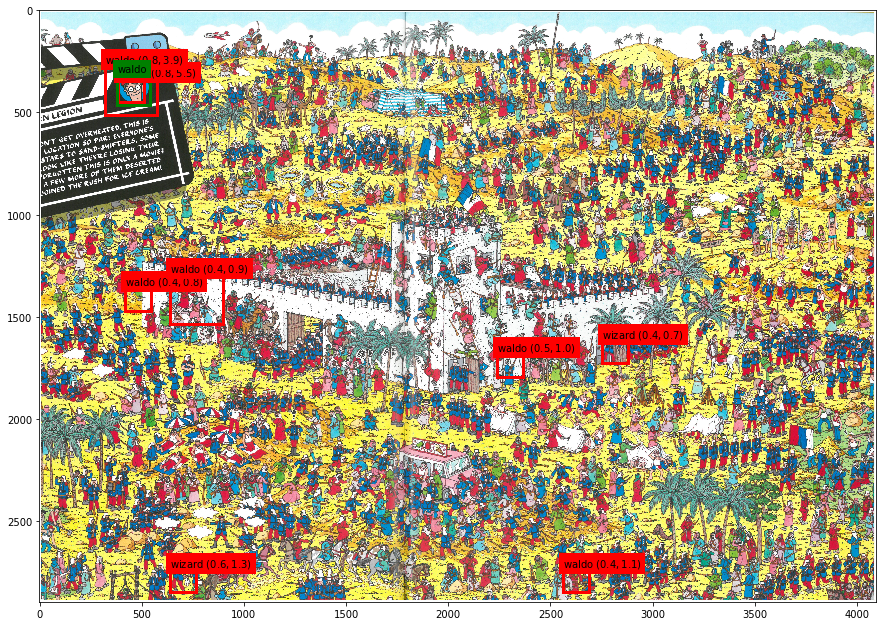

elapsed time 177.59968410599686 s

performing detection on image of size (4096, 2896, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 0, 'y2': 128, 'x1': 800, 'x2': 928}, 'class': 'wenda', 'p': 0.8224511592391509, 'p_ratio': 9.624008259610788}
{'w': {'y1': 0, 'y2': 128, 'x1': 1184, 'x2': 1312}, 'class': 'waldo', 'p': 0.33559554371690836, 'p_ratio': 0.9432478895091461}
{'w': {'y1': 512, 'y2': 640, 'x1': 0, 'x2': 128}, 'class': 'waldo', 'p': 0.40713102751170693, 'p_ratio': 0.7421544957011958}
{'w': {'y1': 384, 'y2': 512, 'x1': 128, 'x2': 256}, 'class': 'waldo', 'p': 0.7738149255503445, 'p_ratio': 4.209081298738441}
{'w': {'y1': 672, 'y2': 800, 'x1': 2496, 'x2': 2624}, 'class': 'waldo', 'p': 0.49847840942624433, 'p_ratio': 1.0874024140406726}
{'w': {'y1': 544, 'y2': 672, 'x1': 1472, 'x2': 1600}, 'class': 'waldo', 'p': 0.3618263720768878, 'p_ratio': 0.7355295824210601}
{'w': {'y1': 416, 'y2': 544, 'x1': 0

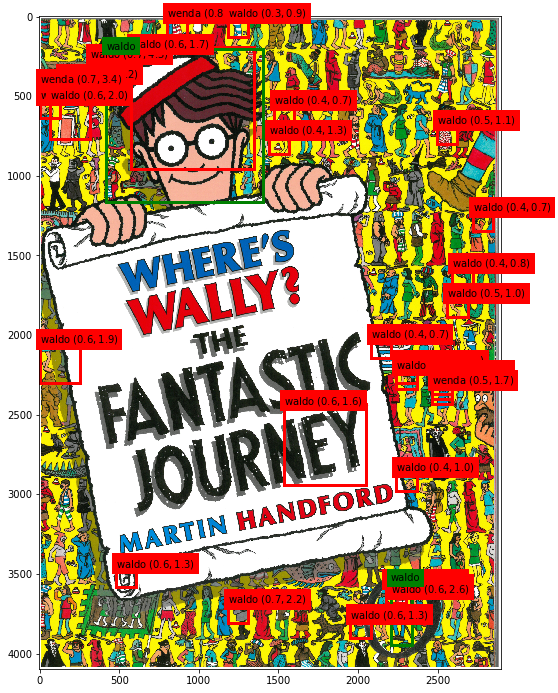

elapsed time 174.6846925889986 s

performing detection on image of size (2896, 4096, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 32, 'y2': 160, 'x1': 1024, 'x2': 1152}, 'class': 'waldo', 'p': 0.8758946393782857, 'p_ratio': 9.151745317572873}
{'w': {'y1': 1248, 'y2': 1376, 'x1': 1632, 'x2': 1760}, 'class': 'waldo', 'p': 0.35169046970080153, 'p_ratio': 1.0304219808149913}
{'w': {'y1': 1024, 'y2': 1152, 'x1': 2240, 'x2': 2368}, 'class': 'wenda', 'p': 0.5016424795945219, 'p_ratio': 1.8389475780193367}
{'w': {'y1': 1056, 'y2': 1184, 'x1': 2240, 'x2': 2368}, 'class': 'wenda', 'p': 0.8050442659996012, 'p_ratio': 6.043752830180378}
{'w': {'y1': 1088, 'y2': 1216, 'x1': 2080, 'x2': 2208}, 'class': 'waldo', 'p': 0.4911768279144704, 'p_ratio': 1.0691539655788767}
{'w': {'y1': 1920, 'y2': 2048, 'x1': 1568, 'x2': 1696}, 'class': 'wenda', 'p': 0.40152701702850385, 'p_ratio': 1.2425715107720867}
{'w': {'y1': 1952

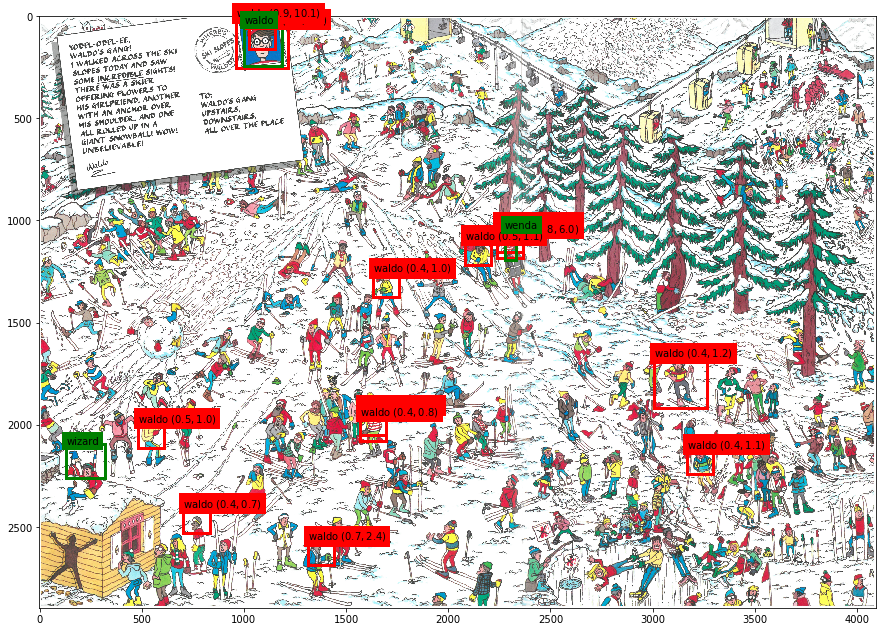

elapsed time 182.66658262400597 s

performing detection on image of size (3000, 4897, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 352, 'y2': 480, 'x1': 1728, 'x2': 1856}, 'class': 'waldo', 'p': 0.519731695007971, 'p_ratio': 1.1195405059577135}
{'w': {'y1': 704, 'y2': 832, 'x1': 2080, 'x2': 2208}, 'class': 'wenda', 'p': 0.5152003091397195, 'p_ratio': 1.6554656079895607}
{'w': {'y1': 256, 'y2': 384, 'x1': 1344, 'x2': 1472}, 'class': 'waldo', 'p': 0.6100949746859793, 'p_ratio': 1.7850060814172308}
{'w': {'y1': 480, 'y2': 608, 'x1': 2368, 'x2': 2496}, 'class': 'waldo', 'p': 0.6847956644245221, 'p_ratio': 2.3389886024898625}
{'w': {'y1': 832, 'y2': 960, 'x1': 2656, 'x2': 2784}, 'class': 'waldo', 'p': 0.49711835710542396, 'p_ratio': 1.6883734884548063}
{'w': {'y1': 736, 'y2': 864, 'x1': 1856, 'x2': 1984}, 'class': 'waldo', 'p': 0.4733446581073064, 'p_ratio': 0.9159356397522038}
{'w': {'y1': 288, 'y2': 4

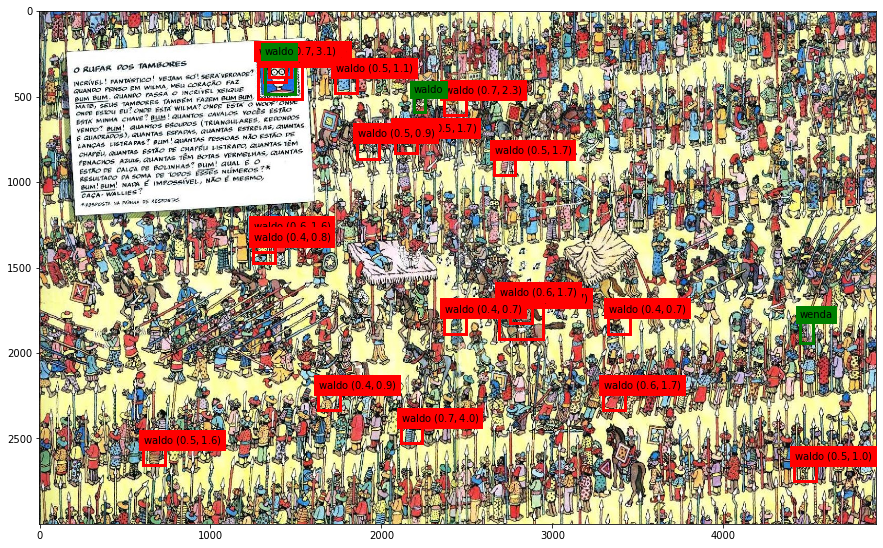

elapsed time 217.30867175999447 s

performing detection on image of size (2896, 4096, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 672, 'y2': 800, 'x1': 1760, 'x2': 1888}, 'class': 'waldo', 'p': 0.7746833330109039, 'p_ratio': 4.025308917884669}
{'w': {'y1': 800, 'y2': 928, 'x1': 1792, 'x2': 1920}, 'class': 'waldo', 'p': 0.5266011207320807, 'p_ratio': 1.1635775957119308}
{'w': {'y1': 1536, 'y2': 1664, 'x1': 1888, 'x2': 2016}, 'class': 'waldo', 'p': 0.43351150658746634, 'p_ratio': 0.8486144269393711}
{'w': {'y1': 1664, 'y2': 1792, 'x1': 3680, 'x2': 3808}, 'class': 'waldo', 'p': 0.38033833376763376, 'p_ratio': 0.7457524773676754}
{'w': {'y1': 2592, 'y2': 2720, 'x1': 1600, 'x2': 1728}, 'class': 'waldo', 'p': 0.4957942467152611, 'p_ratio': 1.0450361379833175}
{'w': {'y1': 1920, 'y2': 2176, 'x1': 2944, 'x2': 3200}, 'class': 'waldo', 'p': 0.3703489459413404, 'p_ratio': 0.6478438090029648}
{'w': {'y1': 192

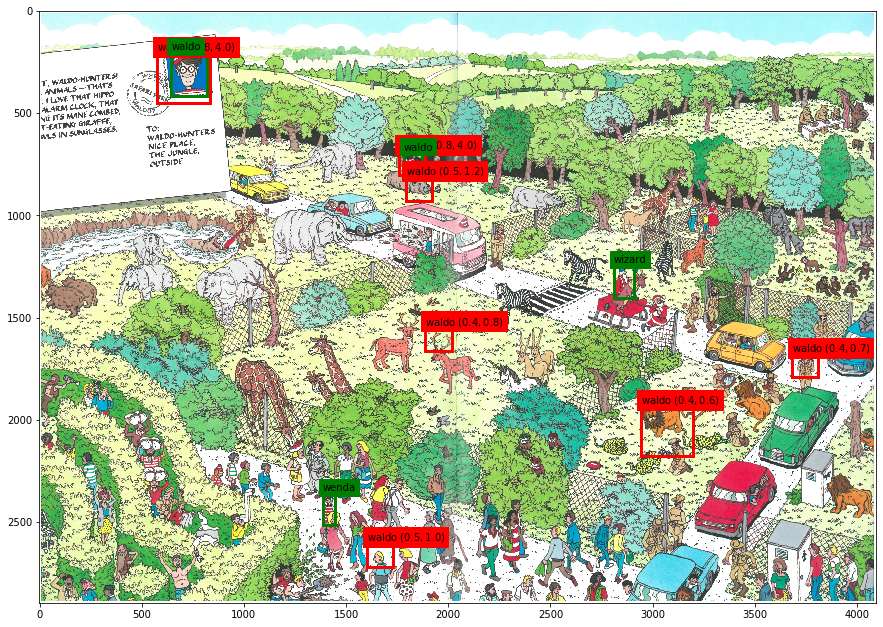

elapsed time 182.28464562199952 s

performing detection on image of size (2896, 4096, 3) with window size 128
transforming image windows into feature space
... done
detecting classes for windows
detections:
{'w': {'y1': 736, 'y2': 864, 'x1': 2144, 'x2': 2272}, 'class': 'waldo', 'p': 0.9599054575609105, 'p_ratio': 35.25835304350284}
{'w': {'y1': 1696, 'y2': 1824, 'x1': 1280, 'x2': 1408}, 'class': 'wizard', 'p': 0.39704931849382485, 'p_ratio': 0.6673961267849724}
{'w': {'y1': 1024, 'y2': 1152, 'x1': 2848, 'x2': 2976}, 'class': 'waldo', 'p': 0.4380386448474739, 'p_ratio': 1.0715203607935153}
{'w': {'y1': 1600, 'y2': 1728, 'x1': 2176, 'x2': 2304}, 'class': 'waldo', 'p': 0.9027810773320831, 'p_ratio': 11.215225107843748}
{'w': {'y1': 1600, 'y2': 1728, 'x1': 3392, 'x2': 3520}, 'class': 'waldo', 'p': 0.5111659867779507, 'p_ratio': 1.339539081104257}
{'w': {'y1': 1440, 'y2': 1568, 'x1': 3872, 'x2': 4000}, 'class': 'wenda', 'p': 0.6648076054941057, 'p_ratio': 2.4898861783921524}
{'w': {'y1': 21

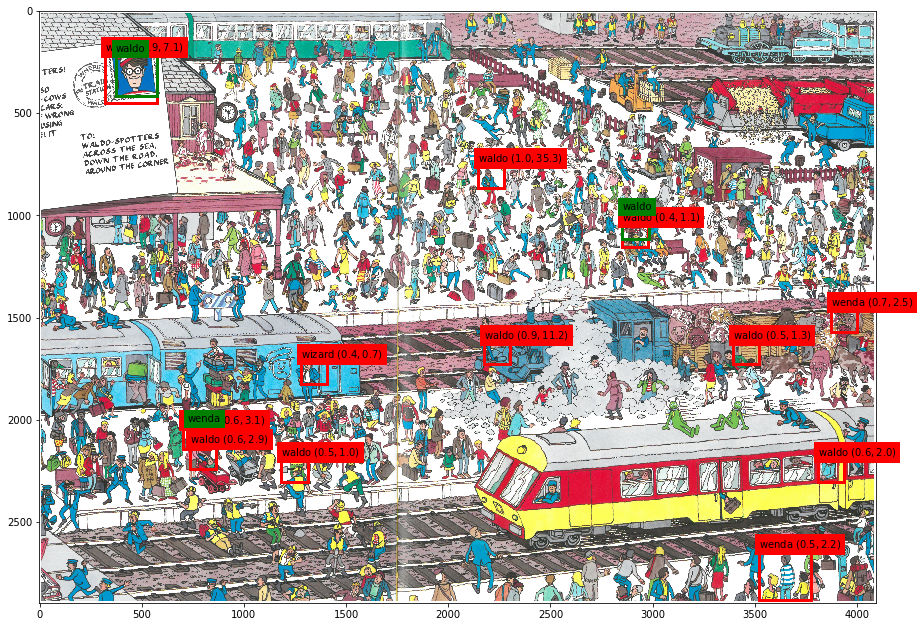

elapsed time 194.9130127630051 s



In [111]:
output = {
    'waldo': [],
    'wenda': [],
    'wizard': []
}

for sample in samples:      
    start = time.perf_counter()
    
    img, gt, s = rescale(sample['img'], ground_truth_boxes=sample['classes'])
    detections = detect_img(img, ground_truth=gt)
    
    print('elapsed time {} s'.format(time.perf_counter() - start))
    print()
    
    # append detections to list
    for d in detections:
        output[d['class']].append('{} {:.3f} {:.1f} {:.1f} {:.1f} {:.1f}'.format(sample['filename'].strip('.jpg'), 
                                                             d['p'], 
                                                             d['w']['x1']/s, 
                                                             d['w']['y1']/s, 
                                                             d['w']['x2']/s, 
                                                             d['w']['y2']/s))
for name, d in output.items():
    with open('./detections/{}.txt'.format(name), 'w') as f:
        f.write('\n'.join(d))



In [113]:
from voc_eval import voc_eval
overlap = 0.1
print('baseline results:')
for name, _ in output.items():
    rec, prec, ap = voc_eval('baseline/{}.txt', 'datasets/Annotations/{}.xml', 
             'datasets/ImageSets/val.txt', name, 'cache/', ovthresh=overlap)
    print('{:>10}  mAP: {:.2f}'.format(name, ap))
    
print('detection results:')
for name, _ in output.items():
    rec, prec, ap = voc_eval('detections/{}.txt', 'datasets/Annotations/{}.xml', 
             'datasets/ImageSets/val.txt', name, 'cache/', ovthresh=overlap)
    print('{:>10}  mAP: {:.2f}'.format(name, ap))


baseline results:
     waldo  mAP: 0.72
     wenda  mAP: 0.47
    wizard  mAP: 0.54
detection results:
     waldo  mAP: 0.26
     wenda  mAP: 0.20
    wizard  mAP: 0.33
